In [1]:
import pandas as pd

import sauna
import numpy as np

/home/exemplar/.local/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
# From ENDF
covariances = sauna.Covariances()
covariances.library = 'ENDF-B-VII.1'
covariances.group_structure = sauna.GROUP_STRUCTURES['WPEC-SG46']
covariances.from_excels(f'../../covariances/{covariances.library}-7/')

Importing covariance data from Excels.
The covariances have been imported successfully.


In [3]:
# From Serpent
sensitivities = sauna.Sensitivities()
sensitivities.group_structure = sauna.GROUP_STRUCTURES['WPEC-SG46']
sensitivities.from_serpent('../../models/MET1000_FC_7_sens0.m') 

INFO:  Reading ../../models/MET1000_FC_7_sens0.m
INFO:    - done


The Serpent sensitivity file contains the following functionals: ['keff', 'beff', 'beffGroup1', 'beffGroup2', 'beffGroup3', 'beffGroup4', 'beffGroup5', 'beffGroup6', 'beffGroup7', 'beffGroup8', 'leff', 'lambda', 'lambdaGroup1', 'lambdaGroup2', 'lambdaGroup3', 'lambdaGroup4', 'lambdaGroup5', 'lambdaGroup6', 'lambdaGroup7', 'lambdaGroup8']


In [5]:
tars = {'Eigenvalue' : 0.003}
target_covariances = sauna.Analysis.tars([sensitivities], covariances, tars, number_of_reactions=5, lower_boundary=5e-3, method='trust-constr')

Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601635
Model 0 Eigenvalue: 0.009610547467601633
Model 0 Eigenvalue: 0.009610547467601633
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601633
Model 0 Eigenvalue: 0.009610547467601635
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.00961054746760163
Model 0 Eigenvalue: 0.00961054746760149
Model 0 Eigenvalue: 0.009610547467601123
Model 0 Eigenvalue: 0.009610547467601534
Model 0 Eigenvalue: 0.00961054746760163
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue: 0.009610547467601637
Model 0 Eigenvalue:

In [6]:
target_covariances_10 = sauna.Analysis.tars([sensitivities], covariances, tars, number_of_reactions=10, lower_boundary=5e-3, method='trust-constr')

Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.01004380278957923
Model 0 Eigenvalue: 0.010043802789579228
Model 0 Eigenvalue: 0.01004380278957923
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579228
Model 0 Eigenvalue: 0.01004380278957923
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579226
Model 0 Eigenvalue: 0.01004380278957909
Model 0 Eigenvalue: 0.010043802789578738
Model 0 Eigenvalue: 0.010043802789579136
Model 0 Eigenvalue: 0.010043802789579226
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 0.010043802789579231
Model 0 Eigenvalue: 

In [7]:
target_covariances_20 = sauna.Analysis.tars([sensitivities], covariances, tars, number_of_reactions=20, lower_boundary=5e-3, method='trust-constr')

Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223427
Model 0 Eigenvalue: 0.010756492622223425
Model 0 Eigenvalue: 0.010756492622223427
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223425
Model 0 Eigenvalue: 0.010756492622223427
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223423
Model 0 Eigenvalue: 0.010756492622223297
Model 0 Eigenvalue: 0.010756492622222967
Model 0 Eigenvalue: 0.010756492622223338
Model 0 Eigenvalue: 0.010756492622223423
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenvalue: 0.010756492622223428
Model 0 Eigenval

In [8]:
dfs     = sauna.Analysis.get_breakdown(sensitivities, covariances)
new_dfs = sauna.Analysis.get_breakdown(sensitivities, target_covariances)

In [9]:
df1 = dfs['Eigenvalue'].copy(deep=True)
df2 = new_dfs['Eigenvalue'].copy(deep=True)
df2 = df2.drop(columns=['Statistical Uncertainty [%]'])
df1 = df1.drop(columns=['Statistical Uncertainty [%]'])

In [10]:
df2.head(20)

,Nuclide 1,Reaction 1,Nuclide 2,Reaction 2,Uncertainty [%]
0,total,total,total,total,5.12492e-01
1,942390,MT18,942390,MT18,2.00343e-01
2,942390,MT1018,942390,MT1018,1.50130e-01
3,922380,MT102,922380,MT102,1.47612e-01
4,260560,MT102,260560,MT102,1.44791e-01
5,942400,MT102,942400,MT102,1.27818e-01
6,942400,MT1018,942400,MT1018,1.14093e-01
7,922380,MT452,922380,MT452,1.10541e-01
8,922380,MT1018,922380,MT1018,1.05958e-01
9,260560,MT2,260560,MT2,1.04494e-01


In [11]:
merged_df = pd.merge(df1, df2, on=['Nuclide 1', 'Reaction 1', 'Nuclide 2', 'Reaction 2'])

truncated_df = merged_df.drop(merged_df[(merged_df['Uncertainty [%]_x'] == merged_df['Uncertainty [%]_y'])].index)
truncated_df.head(20)
#truncated_df.to_excel("output.xlsx", sheet_name='Eigenvalue') 

,Nuclide 1,Reaction 1,Nuclide 2,Reaction 2,Uncertainty [%]_x,Uncertainty [%]_y
0,total,total,total,total,1.04703e+00,5.12492e-01
1,922380,MT4,922380,MT4,8.39329e-01,9.88742e-02
2,922380,MT2,922380,MT4,2.67428e-01,9.00542e-02
3,260560,MT4,260560,MT4,2.04656e-01,5.69594e-02
4,942390,MT18,942390,MT18,2.00343e-01,2.00343e-01
5,942390,MT102,942390,MT102,1.69930e-01,6.41929e-02
6,922380,MT102,922380,MT102,1.57081e-01,1.47612e-01
11,260560,MT2,260560,MT4,1.11321e-01,5.59710e-02
58,942390,MT18,942390,MT102,-1.16564e-02,-1.14822e-02
73,942390,MT2,942390,MT18,-8.25325e-03,-8.25325e-03


In [13]:
dfs     = sauna.Analysis.get_detailed(sensitivities, covariances)
new_dfs = sauna.Analysis.get_detailed(sensitivities, target_covariances_20)
df1 = dfs['Eigenvalue'].copy(deep=True)
df2 = new_dfs['Eigenvalue'].copy(deep=True)
df2 = df2.drop(columns=['Statistical Uncertainty [%]'])
df1 = df1.drop(columns=['Statistical Uncertainty [%]'])

merged_df = pd.merge(df1, df2, on=['Nuclide 1', 'Reaction 1', 'Group 1', 'Nuclide 2', 'Reaction 2', 'Group 2'])
merged_df

,Nuclide 1,Reaction 1,Group 1,Nuclide 2,Reaction 2,Group 2,Uncertainty [%]_x,Uncertainty [%]_y
0,total,total,total,total,total,total,1.04703e+00,3.11911e-01
1,922380,MT4,2,922380,MT4,2,5.22731e-01,2.88382e-02
2,922380,MT4,1,922380,MT4,1,4.09767e-01,2.42270e-02
3,922380,MT4,1,922380,MT4,2,3.54249e-01,2.02318e-02
4,922380,MT4,2,922380,MT4,1,3.54249e-01,2.02318e-02
...,...,...,...,...,...,...,...,...
16999,280600,MT4,5,280600,MT16,5,0.00000e+00,0.00000e+00
17000,280600,MT4,5,280600,MT16,4,0.00000e+00,0.00000e+00
17001,280600,MT4,5,280600,MT16,3,0.00000e+00,0.00000e+00
17002,280600,MT4,5,280600,MT16,2,0.00000e+00,0.00000e+00


In [14]:
truncated_df = merged_df.drop(merged_df[(merged_df['Uncertainty [%]_x'] == merged_df['Uncertainty [%]_y']) | (merged_df['Reaction 1'] != merged_df['Reaction 2']) | (merged_df['Group 1'] != merged_df['Group 2'])].index)
truncated_df
# truncated_df.to_excel("output.xlsx", sheet_name='Eigenvalue') 

,Nuclide 1,Reaction 1,Group 1,Nuclide 2,Reaction 2,Group 2,Uncertainty [%]_x,Uncertainty [%]_y
0,total,total,total,total,total,total,1.04703e+00,3.11911e-01
1,922380,MT4,2,922380,MT4,2,5.22731e-01,2.88382e-02
2,922380,MT4,1,922380,MT4,1,4.09767e-01,2.42270e-02
6,260560,MT4,2,260560,MT4,2,1.97367e-01,2.30987e-02
8,942390,MT18,3,942390,MT18,3,1.14012e-01,1.07408e-01
...,...,...,...,...,...,...,...,...
4485,942410,MT102,7,942410,MT102,7,6.37005e-07,6.37005e-07
4616,922380,MT102,7,922380,MT102,7,2.54294e-07,2.54294e-07
4757,922380,MT1018,6,922380,MT1018,6,7.31710e-08,7.31710e-08
4860,922380,MT2,7,922380,MT2,7,5.30691e-09,5.30691e-09


In [15]:
base_uncs = [0]
new_uncs = [0]
for i in range(len(truncated_df['Uncertainty [%]_x'])-1):
    zam = int(truncated_df.iloc[i+1,truncated_df.columns.get_loc('Nuclide 1')])
    mt  = int(truncated_df.iloc[i+1, truncated_df.columns.get_loc('Reaction 1')][2:])
    group  = int(truncated_df.iloc[i+1, truncated_df.columns.get_loc('Group 1')])
    base_uncertainty = np.sqrt(covariances.get_by_params(zam,zam,mt,mt).dataframe.to_numpy()[7-group,7-group])*100
    new_uncertainty = np.sqrt(target_covariances_20.get_by_params(zam,zam,mt,mt).dataframe.to_numpy()[7-group,7-group])*100
    base_uncs.append(base_uncertainty)
    new_uncs.append(new_uncertainty)

truncated_df['Old [%]_x'] = base_uncs
truncated_df['New [%]_x'] = new_uncs
truncated_df['Change'] = np.sqrt(truncated_df['Uncertainty [%]_x']**2 - truncated_df['Uncertainty [%]_y']**2)
# truncated_df['Old [%]_x']=truncated_df['Old [%]_x'].round(2)
# truncated_df['New [%]_x']=truncated_df['New [%]_x'].round(2)
pd.options.display.float_format = '{:.2f}'.format
truncated_df.sort_values(by='Change', ascending=False).head(30)


,Nuclide 1,Reaction 1,Group 1,Nuclide 2,Reaction 2,Group 2,Uncertainty [%]_x,Uncertainty [%]_y,Old [%]_x,New [%]_x,Change
0,total,total,total,total,total,total,1.05,0.31,0.00,0.00,1.00
1,922380,MT4,2,922380,MT4,2,0.52,0.03,16.91,0.93,0.52
2,922380,MT4,1,922380,MT4,1,0.41,0.02,19.26,1.14,0.41
6,260560,MT4,2,260560,MT4,2,0.20,0.02,11.62,1.36,0.20
10,942390,MT102,4,942390,MT102,4,0.11,0.02,8.24,1.80,0.10
12,942390,MT102,3,942390,MT102,3,0.09,0.02,9.98,2.03,0.09
11,922380,MT102,4,922380,MT102,4,0.10,0.05,1.57,0.78,0.09
13,260560,MT102,3,260560,MT102,3,0.09,0.01,14.71,2.33,0.09
14,110230,MT4,2,110230,MT4,2,0.08,0.02,10.85,2.28,0.08
16,942390,MT1018,1,942390,MT1018,1,0.08,0.03,2.70,1.06,0.07


False
16.907128674023866
1.7372657209786277


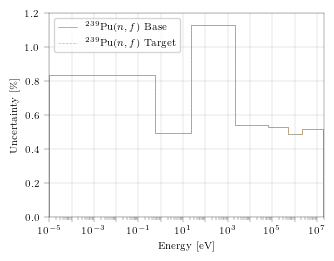

In [16]:
cov_1 = covariances.get_by_params(942390,942390,18,18)
tar_1 = target_covariances.get_by_params(942390,942390,18,18)
cov_2 = covariances.get_by_params(942390,942390,102,102)
tar_2 = target_covariances.get_by_params(942390,942390,102,102)
sauna.Plot.plot_uncertainty([cov_1, tar_1], format = 'svg', annotations = [' Base', ' Target'])
print(np.sqrt(covariances.get_by_params(922380,922380,4,4).dataframe.to_numpy()[5,5])*100)
print(np.sqrt(target_covariances.get_by_params(922380,922380,4,4).dataframe.to_numpy()[5,5])*100)

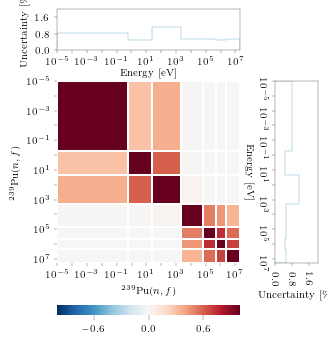

In [17]:
sauna.Plot.plot_cor(cov_1, format = 'svg')

False


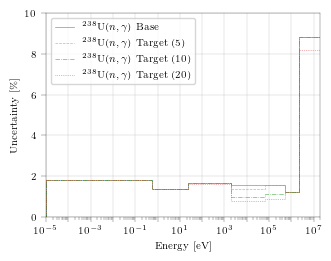

In [18]:
cov_0             = covariances.get_by_params(922380,922380,102,102)
tar_0      = target_covariances.get_by_params(922380,922380,102,102)
tar_010 = target_covariances_10.get_by_params(922380,922380,102,102)
tar_020 = target_covariances_20.get_by_params(922380,922380,102,102)
sauna.Plot.plot_uncertainty([cov_0, tar_0, tar_010, tar_020], format = 'pdf', annotations = [' Base', ' Target (5)', ' Target (10)', ' Target (20)'])

False


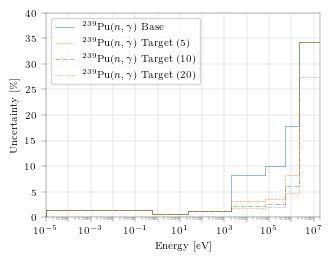

In [19]:
cov_1             = covariances.get_by_params(942390,942390,102,102)
tar_1      = target_covariances.get_by_params(942390,942390,102,102)
tar_110 = target_covariances_10.get_by_params(942390,942390,102,102)
tar_120 = target_covariances_20.get_by_params(942390,942390,102,102)
sauna.Plot.plot_uncertainty([cov_1, tar_1, tar_110, tar_120], format = 'pdf', annotations = [' Base', ' Target (5)', ' Target (10)', ' Target (20)'])

False


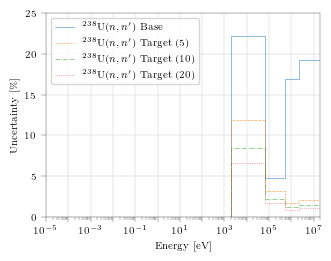

In [20]:
cov_2             = covariances.get_by_params(922380,922380,4,4)
tar_2      = target_covariances.get_by_params(922380,922380,4,4)
tar_210 = target_covariances_10.get_by_params(922380,922380,4,4)
tar_220 = target_covariances_20.get_by_params(922380,922380,4,4)
sauna.Plot.plot_uncertainty([cov_2, tar_2, tar_210, tar_220], format = 'pdf', annotations = [' Base', ' Target (5)', ' Target (10)', ' Target (20)'])

False


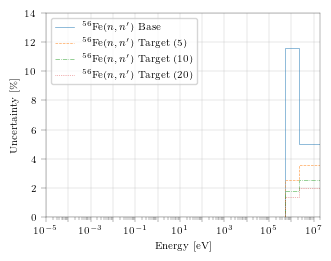

In [21]:
cov_3             = covariances.get_by_params(260560,260560,4,4)
tar_3      = target_covariances.get_by_params(260560,260560,4,4)
tar_310 = target_covariances_10.get_by_params(260560,260560,4,4)
tar_320 = target_covariances_20.get_by_params(260560,260560,4,4)
sauna.Plot.plot_uncertainty([cov_3, tar_3, tar_310, tar_320], format = 'pdf', annotations = [' Base', ' Target (5)', ' Target (10)', ' Target (20)'])

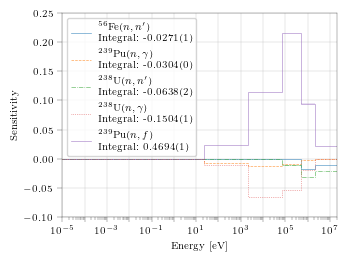

In [22]:
sensitivity_1 = sensitivities.get_by_params('Eigenvalue', 260560, 4)
sensitivity_2 = sensitivities.get_by_params('Eigenvalue', 942390,102)
sensitivity_3 = sensitivities.get_by_params('Eigenvalue', 922380,4)
sensitivity_4 = sensitivities.get_by_params('Eigenvalue', 922380, 102)
sensitivity_5 = sensitivities.get_by_params('Eigenvalue', 942390,18)

sauna.Plot.plot_sensitivity([sensitivity_1,sensitivity_2,sensitivity_3,sensitivity_4,sensitivity_5], format = 'pdf', show_integral = True, normalization_type = 0)